In [83]:
import torch
import random
import numpy as np
import jams
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import umap
from utils import update_stats, truncate, label_beats
import librosa
import librosa.display
import warnings
import IPython.display as ipd


In [164]:
y, sr = librosa.load('0739_ikissedagirl.mp3')
start = next((i for i, x in enumerate(y) if x), None)/sr
end = (len(y) - next((i for i, x in enumerate(y[::-1]) if x), None))/sr
print(start, end)
#y = y[start:len(y)-end]
n_bins=72
n_octave=6
min_freq=None
bpo = int(n_bins / n_octave)
tempo, beats = librosa.beat.beat_track(y=y, sr=sr, hop_length=128)
beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=128)
#beat_times = np.load('beats_Isophonics_01 Bohemian Rhapsody.npy')
#beats = librosa.time_to_frames(beat_times, sr=sr, hop_length=256)
clicks = librosa.clicks(beat_times, sr=sr, length=len(y))
ipd.Audio(y + clicks, rate=sr)

D:\Logiciels\Anaconda\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


0.5650340136054421 179.957641723356


# Beat-Synchronised CQTs

In [165]:
C = np.abs(librosa.cqt(y=y, sr=sr, hop_length=128, fmin=min_freq, n_bins=n_bins, bins_per_octave=bpo))
print(C.shape)
print(beats.shape)
beats = librosa.util.fix_frames(beats, x_min = beats[0], x_max=C.shape[1], pad=False)

(72, 31853)
(382,)


In [166]:
print(beats.shape)
sub_beats = librosa.segment.subsegment(C, beats, n_segments=16)
print(sub_beats.shape)
sub_beats= librosa.util.fix_frames(sub_beats, x_min=beats[0], x_max=beats[-1], pad=False)
print(sub_beats.shape)
C_avg = librosa.util.sync(C, beats, pad=False)
C_med = librosa.util.sync(C, beats, aggregate=np.median, pad=False)
print(C_med.shape)
C_med_sub = librosa.util.sync(C, sub_beats, aggregate=np.median, pad=False)
print(C_med_sub.shape)
print(beats[:20])
print(sub_beats[:20])
print(sub_beats.shape)

(382,)
(6128,)
(6097,)
(72, 381)
(72, 6096)
[  24  104  184  263  343  423  502  582  661  741  821  901  981 1060
 1140 1219 1298 1378 1459 1537]
[ 24  77  83  87  89  91  93  94  95  96  97  98  99 100 101 103 104 108
 110 114]
(6097,)


In [167]:
track_annotations = jams.load('Isophonics_01 A Kind Of Magic.jams')
annotation_seg = track_annotations.search(namespace='segment_open')[0].data
boundaries = [obs.time for obs in annotation_seg]
labels = [obs.value for obs in annotation_seg]
print(labels)
print(annotation_seg[-1].duration)

['silence', 'intro', 'verse', 'bridgea', 'refrain', 'verse', 'refrain_(instrumental_solo)', 'bridgeb', 'refrain', 'break', 'outro_(instrumental_solo)', 'silence']
1.832


In [129]:
labels_set = set(labels)
labels2id = {label : i for i, label in enumerate(labels)}

print(labels_set, end='\n\n')
print(labels2id, end='\n\n')
labels.insert(0, 'test')
labels

{'refrain', 'verse', 'refrain_(instrumental_solo)', 'bridgea', 'silence', 'break', 'intro', 'outro_(instrumental_solo)', 'bridgeb'}

{'silence': 11, 'intro': 1, 'verse': 5, 'bridgea': 3, 'refrain': 8, 'refrain_(instrumental_solo)': 6, 'bridgeb': 7, 'break': 9, 'outro_(instrumental_solo)': 10}



['test',
 'silence',
 'intro',
 'verse',
 'bridgea',
 'refrain',
 'verse',
 'refrain_(instrumental_solo)',
 'bridgeb',
 'refrain',
 'break',
 'outro_(instrumental_solo)',
 'silence']

[Text(0.5, 1.0, 'Sub-beat synchronous CQT power, shape=(72, 6096)')]

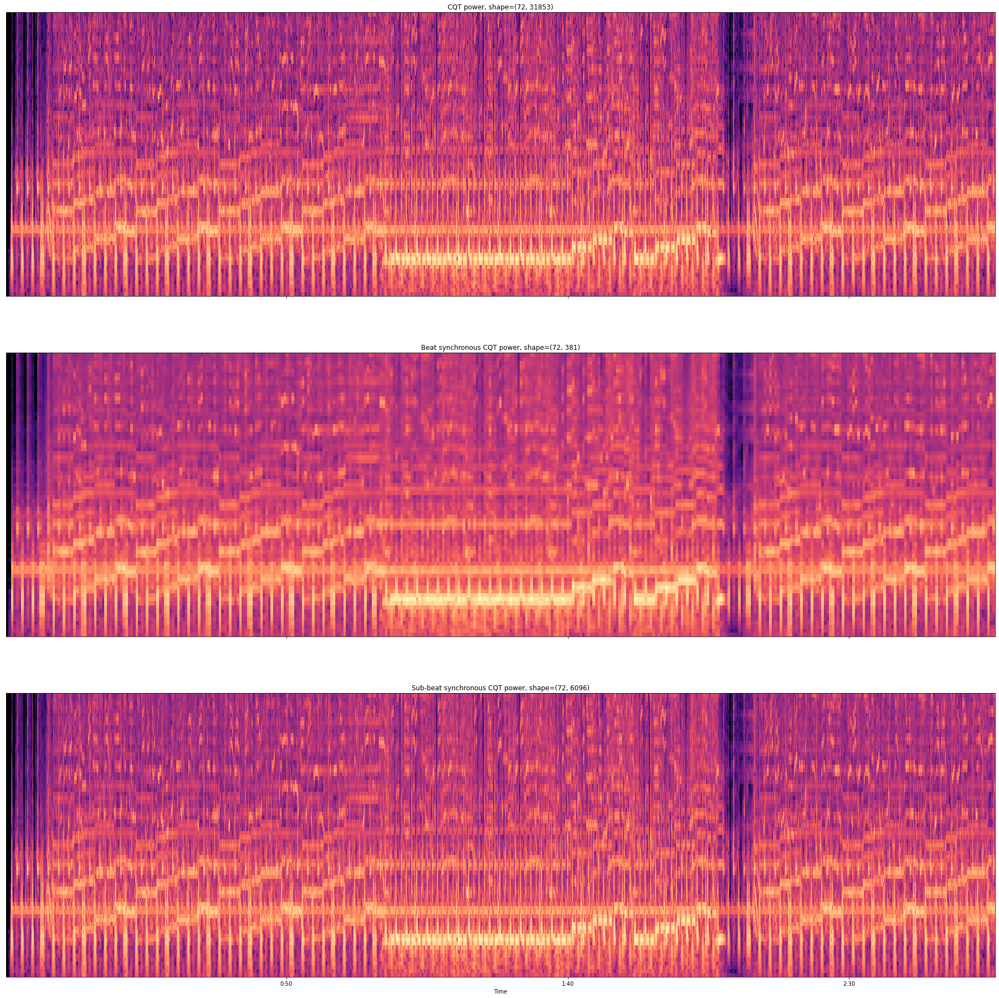

In [157]:
import matplotlib.pyplot as plt

beat_t = librosa.frames_to_time(beats, sr=sr, hop_length=256)
subbeat_t = librosa.frames_to_time(sub_beats, sr=sr, hop_length=256)
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True, figsize=(32,32))
librosa.display.specshow(librosa.amplitude_to_db(C, ref=np.max), hop_length=256, sr=sr, x_axis='time', ax=ax[0])
ax[0].set(title='CQT power, shape={}'.format(C.shape))
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(C_med, ref=np.max), hop_length=256, sr=sr, x_coords=beat_t, x_axis='time', ax=ax[1])

ax[1].set(title='Beat synchronous CQT power, '
          'shape={}'.format(C_med.shape))

ax[1].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(C_med_sub, ref=np.max), hop_length=256, sr=sr, x_coords=subbeat_t, x_axis='time', ax=ax[2])
lims = ax[2].get_ylim()
#ax[2].vlines(beat_t, lims[0], lims[1], color='lime', alpha=0.9,
#           linewidth=2, label='Beats')
#ax[2].vlines(subbeat_t, lims[0], lims[1], color='linen', linestyle='--',
#           linewidth=1.5, alpha=0.5, label='Sub-beats')
#ax[2].legend()
ax[2].set(title='Sub-beat synchronous CQT power, ' 'shape={}'.format(C_med_sub.shape))


# Experiment with subsegment

In [42]:
y, sr = librosa.load('0739_ikissedagirl.mp3', duration=5)
tempo, beats = librosa.beat.beat_track(y=y, sr=sr, hop_length=128)
beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=128)
cqt = np.abs(librosa.cqt(y, sr=sr, hop_length=256, fmin=min_freq, n_bins=n_bins, bins_per_octave=bpo))

D:\Logiciels\Anaconda\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [76]:
print(beats[-20:])
print(sub_beats[-20:])

[24343 24381 24419 24456 24496 24533 24572 24610 24647 24685 24723 24761
 24800 24838 24876 24915 24952 24991 25029 25333]
[25015 25018 25024 25026 25029 25032 25034 25036 25042 25045 25049 25053
 25064 25070 25075 25085 25100 25109 25140 25149]


D:\Logiciels\Anaconda\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


[Text(0.5, 1.0, 'CQT + Beat and sub-beat markers')]

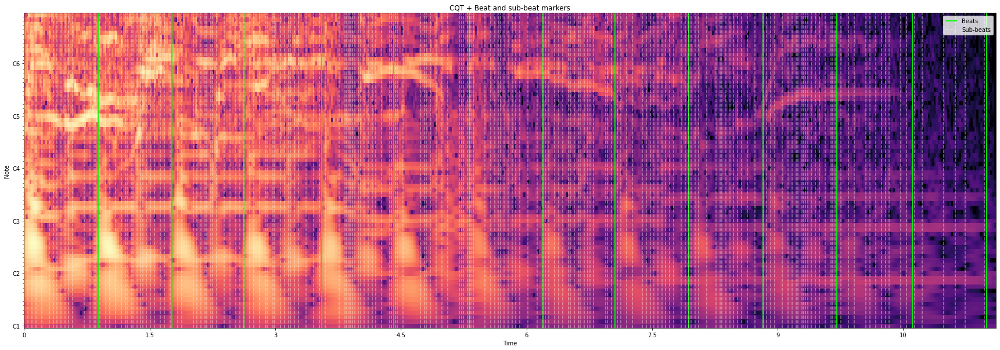

In [74]:
#subseg = librosa.segment.subsegment(cqt, beats, n_segments=8)
#subseg_t = librosa.frames_to_time(subseg, sr=sr)
#import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(30,10))
librosa.display.specshow(librosa.amplitude_to_db(C[:, -500:],
                                                 ref=np.max),
                         y_axis='cqt_note', x_axis='time', ax=ax)
lims = ax.get_ylim()
ax.vlines(beat_t[-20:]-beat_t[-20], lims[0], lims[1], color='lime', alpha=0.9,
           linewidth=2, label='Beats')
ax.vlines(subbeat_t[-200:]-subbeat_t[-200], lims[0], lims[1], color='linen', linestyle='--',
           linewidth=1.5, alpha=0.5, label='Sub-beats')
ax.legend()
ax.set(title='CQT + Beat and sub-beat markers')

In [33]:
print(sub_beats.shape)
print(beats.shape)

(142,)
(17,)
[  6  26  46  66  86 106 126 146 166 186 206 226 246 265 285 305 325]
[  0   1   2   3   4   5   6  19  20  21  22  23  24  25  26  27  28  29
  31  33  38  45  46  47  48  50  59  63  64  65  66  67  69  71  73  78
  84  85  86  87  88  90  99 102 103 104 106 107 109 111 113 117 124 125
 126 129 136 137 140 141 143 144 146 147 149 151 157 163 164 165 166 168
 171 173 175 181 183 184 186 188 190 192 197 200 204 205 206 207 210 213
 217 222 223 224 226 228 230 232 237 242 244 245 246 248 253 257 260 262
 263 264 265 267 268 270 275 278 281 284 285 288 294 296 298 300 302 303
 305 306 308 310 311 318 323 324 325 341 350 363 381 389 422 425]


In [20]:
cqts = np.load('cqts_0739_ikissedagirl.npy')
beats = np.load('beats_0739_ikissedagirl.npy')
clicks = librosa.clicks(beats, sr=sr, length=len(song))
#cqts = cqts.reshape((72,-1))
cqts.shape

(399, 72, 128)

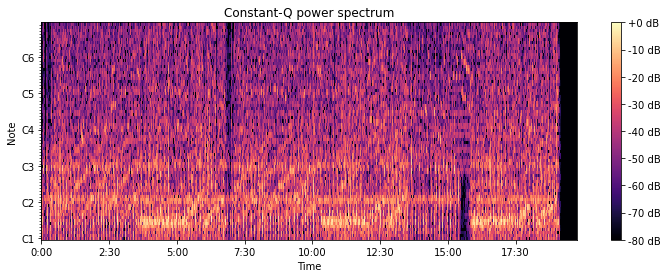

In [68]:
cqts_flat = np.zeros((72, 128*399))
for i in range(399):
    cqts_flat[:, 128*i:128*(i+1)] = cqts[i]
fig, ax = plt.subplots(figsize=(12,4))

b = 128
img = librosa.display.specshow(librosa.amplitude_to_db(cqts_flat, ref=np.max),

                               sr=sr, x_axis='time', y_axis='cqt_note', ax=ax)

ax.set_title('Constant-Q power spectrum')

fig.colorbar(img, ax=ax, format="%+2.0f dB")

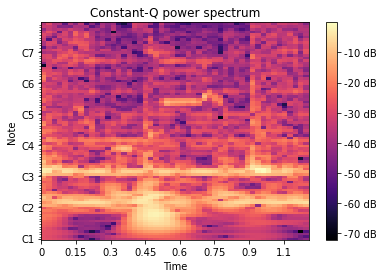

In [55]:
y, sr = librosa.load('0739_ikissedagirl.mp3')
C = np.abs(librosa.cqt(y, sr=sr))

fig, ax = plt.subplots()

img = librosa.display.specshow(librosa.amplitude_to_db(C[:,1000:1050], ref=np.max),

                               sr=sr, x_axis='time', y_axis='cqt_note', ax=ax)

ax.set_title('Constant-Q power spectrum')

fig.colorbar(img, ax=ax, format="%+2.0f dB")

(84, 7964)


D:\Logiciels\Anaconda\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


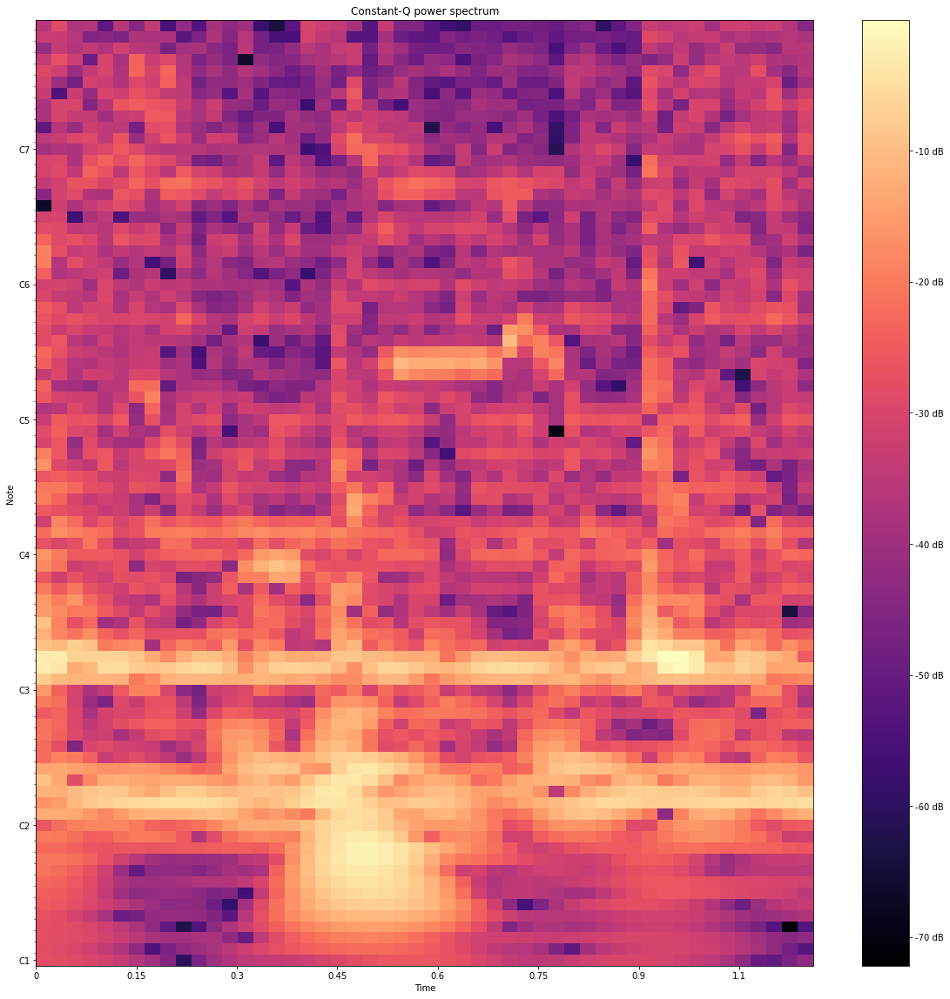

In [58]:
print(C.shape)

fig, ax = plt.subplots(figsize=(20,20))

img = librosa.display.specshow(librosa.amplitude_to_db(C[:,1000:1050], ref=np.max),

                               sr=sr, x_axis='time', y_axis='cqt_note', ax=ax)

ax.set_title('Constant-Q power spectrum')

fig.colorbar(img, ax=ax, format="%+2.0f dB")

### Experimations on positive, negative min and negative max $\delta$s

In [10]:
# set parameters
data_path = "/ldaphome/atiam-1005/music-structure-estimation/data/Isophonics/"
tracks = glob.glob(data_path+"audio/*.mp3")
tracks = [t.replace(data_path+"audio/", '').replace('.mp3','') for t in tracks]
delta_p = np.arange(1, 20, 2)
delta_n = np.arange(4, 36, 2)
n_anchors = 10
num_trials = n_anchors * len(tracks)
fp_vec = np.zeros_like(delta_p)
fn_matrix = np.zeros((len(delta_n), len(delta_n)))


# compute for each track
for k, track in enumerate(tracks) :
    print("track n°" + str(k + 1) + "/" + str(len(tracks)))
    track_annotations = jams.load(data_path + "references/" + track + ".jams")
    annotation_seg = track_annotations.search(namespace='segment_open')[0].data
    boundaries = [obs.time for obs in annotation_seg]
    duration = track_annotations.file_metadata.duration
    fp_vec, fp_matrix = update_stats(n_anchors, fp_vec, fn_matrix, boundaries, duration, delta_p, delta_n)

# for plotting issues
fn_matrix[fn_matrix==0] = 0.5*num_trials


### False Positive and False Negative plots

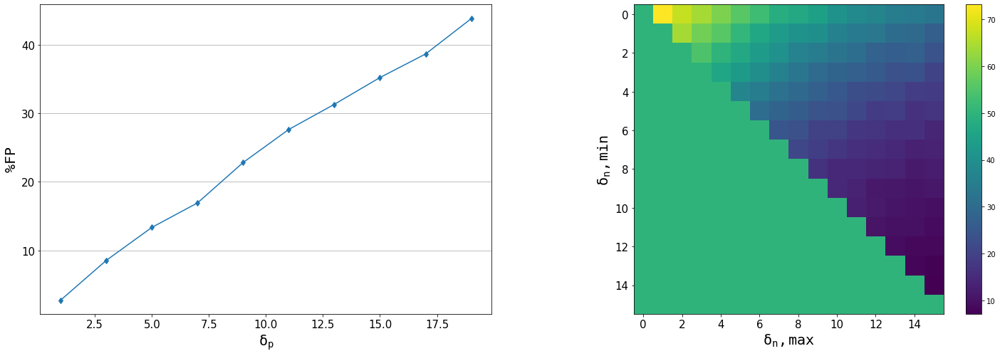

In [2]:
import matplotlib.pyplot as plt

plt.figure(figsize=(25,8))
plt.subplot(1,2,1)
plt.plot(delta_p, fp_vec*100/(n_anchors * len(tracks)), '-d')
plt.xlabel('$\mathtt{\delta_p}$', fontsize=20)
plt.ylabel('$\mathtt{\%FP}$', fontsize=20)
plt.grid(axis='y')
plt.tick_params('both', labelsize=15)

plt.subplot(1,2,2)
plt.imshow(fn_matrix*100/num_trials)
plt.colorbar()
plt.xlabel('$\mathtt{\delta_n,max}$', fontsize=20)
plt.ylabel('$\mathtt{\delta_n,min}$', fontsize=20)
plt.tick_params('both', labelsize=15)

### ConvNet for learning audio learning


In [28]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch_same_pad import get_pad

class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        kernel_conv = (4, 6)
        self.pad1 = get_pad((72, 512), kernel_conv)
        self.conv1 = nn.Conv2d(1, 64, kernel_conv)
        self.bnc1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=(2, 4))
        self.pad2 = get_pad((36,128), kernel_conv)
        self.conv2 = nn.Conv2d(64, 128, kernel_conv)
        self.bnc2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(kernel_size=(3, 4))
        self.pad3 = get_pad((12,32), kernel_conv)
        self.conv3 = nn.Conv2d(128, 256, kernel_conv)
        self.bnc3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(kernel_size=(2, 4))
        self.fc1 = nn.Linear(6 * 8 * 256, 128)
        self.bnf1 = nn.BatchNorm1d(128)
        self.fc2 = nn.Linear(128, 128)
        self.bnf2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 128)
        self.bnf3 = nn.BatchNorm1d(128)

    def apply_cnn(self,x):
        x = x.unsqueeze(1) # for 1 channel
        x = self.pool1(self.bnc1(F.relu(self.conv1(F.pad(x,self.pad1)))))
        x = self.pool2(self.bnc2(F.relu(self.conv2(F.pad(x,self.pad2)))))
        x = self.pool3(self.bnc3(F.relu(self.conv3(F.pad(x,self.pad3)))))
        x = x.view(-1, 6 * 8 * 256)
        x = self.bnf1(F.relu(self.fc1(x)))
        x = self.bnf2(F.relu(self.fc2(x)))
        x = F.normalize(F.relu(self.fc3(x)), p=2)
        return x

    def forward(self, x):
        a = self.apply_cnn(x[:, 0, :, :])
        p = self.apply_cnn(x[:, 1, :, :])
        n = self.apply_cnn(x[:, 2, :, :])
        
        return a, p, n
    
    def inference(self, x):
        return self.apply_cnn(x)

### Load trained model

In [29]:
model = ConvNet()
model.eval()
model.load_state_dict(torch.load("model239.pt", map_location=torch.device('cpu')))
cqts = np.load('cqts_0739_ikissedagirl.npy')
n_beats = cqts.shape[0]
inputs = np.zeros((n_beats - 3, 72, 512))

for i in range(n_beats - 3):
    inputs_i = np.append(cqts[i], cqts[i + 1], axis=1)
    inputs_i = np.append(inputs_i, cqts[i + 2], axis=1)
    inputs_i = np.append(inputs_i, cqts[i + 3], axis=1)
    
    inputs[i] = inputs_i
    
inputs = torch.from_numpy(inputs).float()

### Boundary detection with SSM and learned embeddings

In [53]:
from scipy.signal import medfilt2d

# constant parameters
sigma = 18.5*2
kappa = 40
T = 10
tau = 1.35

# chessboard kernel
chb_size = 2*kappa+1
g = np.zeros((chb_size, chb_size))
for i in range(-kappa, kappa+1):
    for j in range(-kappa, kappa+1):
        if abs (i) <= 1 or abs(j) <=1:
            pass
        else:
            r2 = i**2+j**2
            g[i+kappa,j+kappa] = np.sign(i) * np.sign(j) * np.exp(-r2/(2*sigma**2))
            #g[i,j] = np.exp(-(i+j - 2)**2/sigma)

# novel function
def novelty(ssm, nu, g):
    eta = 0
    for i in range(-kappa, kappa+1):
        for j in range(-kappa, kappa+1):
            eta += ssm[nu + i, nu + j] * g[i, j]
    return eta

In [31]:
# Randomly selected track
# track, sr = librosa.load(root_path + "audio/" + random.choice(track_path) + ".mp3")
# Compute CQT through all the audio
# hop_size = int(1.94e-3*sr)
# cqts = torch.from_numpy(librosa.cqt(track, sr, hop_size, fmin=40, n_bins=72, bins_per_octave=12))

# Compute SSM

# Compute audio embeddings from the trained CNN
n_embeddings = inputs.size(0)
ssm = np.zeros((n_embeddings, n_embeddings)) + 1
embeddings = np.zeros((n_embeddings, 128))
for j in range(int(n_embeddings//10)):
    embeddings[10*j:10*(j+1)] = model.inference(inputs[j:j+10]).cpu().detach().numpy()

        

In [24]:
test = torch.zeros((10))
ids = torch.randperm(5).numpy()
test[ids]

tensor([0., 0., 0., 0., 0.])

## Visualizing the data

We can visualize this in two dimensions using [UMAP](https://umap-learn.readthedocs.io/en/latest/) embedding.
UMAP learns a transformation of high-dimensional data (in our case, 128 dimensions) to a low dimensional space which approximately preserves neighborhoods.
The output coordinates do not have any particular meaning, but the local structure of data in the embedding space should give a sense of how well organized the high-dimensional space is.

In [5]:
path_beats = './beats_0739_ikissedagirl.npy'
path_labels = './0739_ikissedagirl.txt'
'{0}.txt'.format(path_beats)

'./beats_0739_ikissedagirl.npy.txt'

In [8]:
# Associate a music structure analysis label to every beat according to the annotation
beats = np.load(path_beats)
f = open(path_labels,'r')
segments = [['silence', -1]]
for line in f.readlines():
    line = line.split()
    segments.append([truncate(float(line[0]), 1), line[1]])

cursor = 0
labels = [''] * len(beats)
k = 0
for i, b in enumerate(beats):
    if k != len(segments)-1 and b >= segments[k+1][0]:
        k +=1
    labels[i] = segments[k][1]

print(labels[-20:])
print(beats[-20:])

['chorus', 'chorus', 'chorus', 'chorus', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end', 'end']
[175.51 175.98 176.44 176.9  177.36 177.81 178.29 178.73 179.21 179.65
 180.11 180.59 181.08 181.55 182.04 182.53 183.01 183.49 183.97 184.43]


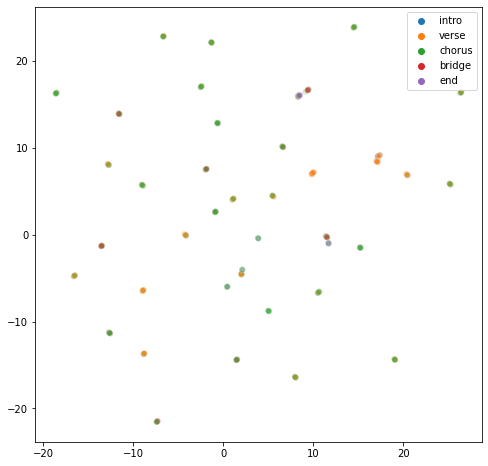

In [49]:
RNG_STATE = 2021
reducer = umap.UMAP(random_state=RNG_STATE)

# Fit on the transformed data, and then transform the test data
embed = reducer.fit_transform(embeddings)
#embed_test = reducer.transform(embeddings)


fig, ax = plt.subplots(figsize=(8, 8))
sns.scatterplot(x=embed[:, 0], y=embed[:, 1], hue=seg_beats, marker='o', alpha=0.2, legend='brief', ax=ax)
ax.legend(bbox_to_anchor=(1, 1));

#fig, ax = plt.subplots(figsize=(8, 8))
#sns.scatterplot(x=embed[:, 0], y=embed[:, 1], hue=Y_train_raw, marker='o', alpha=0.2, legend=None, ax=ax)
#sns.scatterplot(x=embed_test[:, 0], y=embed_test[:, 1], hue=Y_test_raw, marker='x', s=50, alpha=1, legend='brief', ax=ax)
#ax.legend(bbox_to_anchor=(1, 1));
#ax.set(title='Original space (no metric learning)');

In [50]:
embed.shape

(396, 2)

(399,)
(399, 9216)


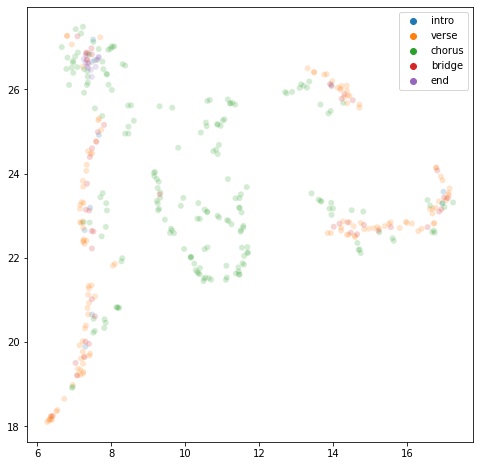

In [75]:
RNG_STATE = 2021
reducer = umap.UMAP(random_state=RNG_STATE)

# Fit on the transformed data, and then transform the test data
print(beats.shape)
print(cqts.shape)
cqts = cqts.reshape((-1,72*128))
embed = reducer.fit_transform(cqts)
#embed_test = reducer.transform(embeddings)


fig, ax = plt.subplots(figsize=(8, 8))
sns.scatterplot(x=embed[:, 0], y=embed[:, 1], hue=seg_beats, marker='o', alpha=0.2, legend='brief', ax=ax)
ax.legend(bbox_to_anchor=(1, 1));

#fig, ax = plt.subplots(figsize=(8, 8))
#sns.scatterplot(x=embed[:, 0], y=embed[:, 1], hue=Y_train_raw, marker='o', alpha=0.2, legend=None, ax=ax)
#sns.scatterplot(x=embed_test[:, 0], y=embed_test[:, 1], hue=Y_test_raw, marker='x', s=50, alpha=1, legend='brief', ax=ax)
#ax.legend(bbox_to_anchor=(1, 1));
#ax.set(title='Original space (no metric learning)');

In [35]:
print(np.shape(embed[:, 0]))
print(np.shape(embed[:, 1]))
print(np.shape(seg_beats))

(396,)
(396,)
(400,)


# Computing SSM

In [54]:
for i in range(n_embeddings):
    for j in range(n_embeddings):
        ssm[i, j] = np.linalg.norm(embeddings[i]-embeddings[j], 2)
        
print(ssm.shape)
ssm = medfilt2d(ssm, (9,9))
#ssm = median_filter(ssm)
print(ssm.shape)

print("g of size", g.shape)
# Compute novelty vector
nov = np.empty((n_embeddings - 2 * kappa))
for i in range(n_embeddings - 2 *kappa):
    nov[i] = novelty(ssm, i + kappa, g)

(396, 396)
(396, 396)
g of size (81, 81)


In [76]:
embed = embed/np.linalg.norm(embed,2)

In [77]:
for i in range(n_embeddings):
    for j in range(n_embeddings):
        ssm[i, j] = np.linalg.norm(embed[i]-embed[j], 2)
        
print(ssm.shape)
ssm = medfilt2d(ssm, (9,9))
#ssm = median_filter(ssm)
print(ssm.shape)

print("g of size", g.shape)
# Compute novelty vector
nov = np.empty((n_embeddings - 2 * kappa))
for i in range(n_embeddings - 2 *kappa):
    nov[i] = novelty(ssm, i + kappa, g)

(396, 396)
(396, 396)
g of size (81, 81)


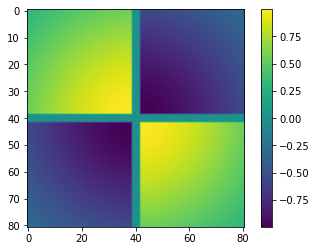

In [61]:
plt.imshow(g)
plt.colorbar()


In [62]:
# Detect peaks


peak_to_mean = np.zeros((nov.shape[0] - 2*T))
for i in range(T, nov.shape[0] - T):
    peak_to_mean[i - T] = (2*T+1)*nov[i]/np.sum(nov[i-T:i+T+1])
  
peaks = np.where(peak_to_mean > tau)

In [63]:
peak_to_mean
peaks

(array([185, 186, 187, 188, 189, 190, 191, 192, 244, 245, 246, 247, 248,
        249, 250, 251, 252, 253, 254, 255, 256], dtype=int64),)

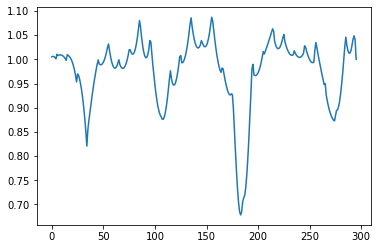

In [58]:
plt.plot(peak_to_mean)

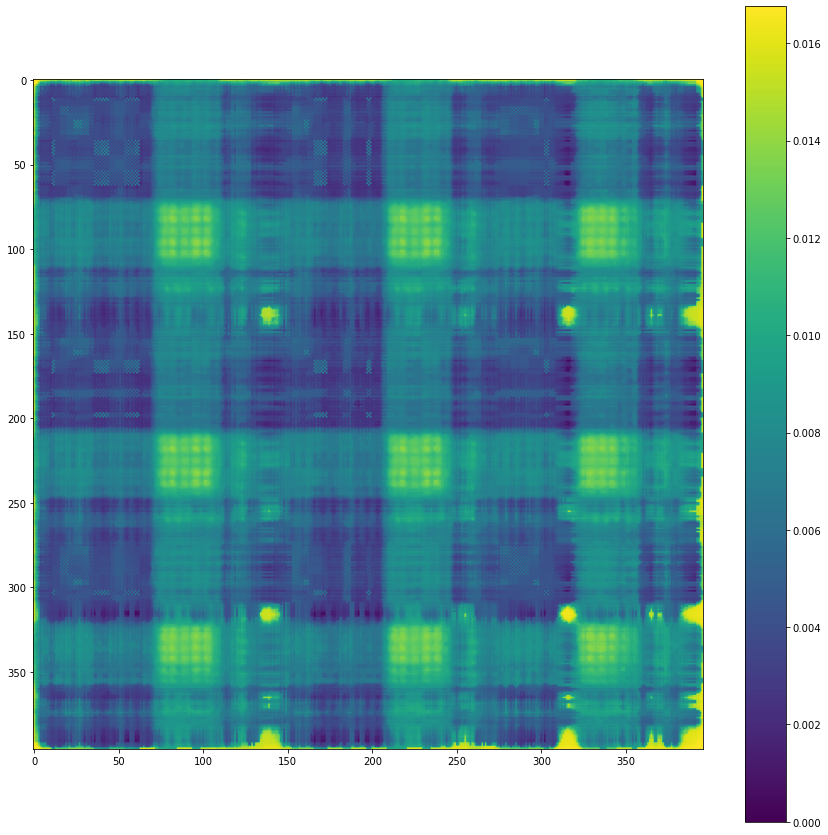

In [78]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,15))
ssm_bis = np.max(ssm) - ssm
plt.imshow(ssm_bis)
plt.colorbar()
#plt.xlabel('$\mathtt{\delta_n,max}$', fontsize=20)
#plt.ylabel('$\mathtt{\delta_n,min}$', fontsize=20)
#plt.tick_params('both', labelsize=15)

In [147]:
#!/usr/bin/env python
# coding: utf-8
import librosa
import logging
import numpy as np
from scipy.spatial import distance
from scipy import signal
from scipy.ndimage import filters
import pylab as plt


def median_filter(X, M=8):
    """Median filter along the first axis of the feature matrix X."""
    for i in range(X.shape[1]):
        X[:, i] = filters.median_filter(X[:, i], size=M)
    return X


def compute_gaussian_krnl(M):
    """Creates a gaussian kernel following Foote's paper."""
    g = signal.gaussian(M, M // 3., sym=True)
    G = np.dot(g.reshape(-1, 1), g.reshape(1, -1))
    G[M // 2:, :M // 2] = -G[M // 2:, :M // 2]
    G[:M // 2, M // 2:] = -G[:M // 2, M // 2:]
    return G


def compute_ssm(X, metric="seuclidean"):
    """Computes the self-similarity matrix of X."""
    D = distance.pdist(X, metric=metric)
    D = distance.squareform(D)
    D /= D.max()
    return 1 - D


def compute_nc(X, G):
    """Computes the novelty curve from the self-similarity matrix X and
        the gaussian kernel G."""
    N = X.shape[0]
    M = G.shape[0]
    nc = np.zeros(N)

    for i in range(M // 2, N - M // 2 + 1):
        nc[i] = np.sum(X[i - M // 2:i + M // 2, i - M // 2:i + M // 2] * G)

    # Normalize
    nc += nc.min()
    nc /= nc.max()
    return nc


def pick_peaks(nc, L=16):
    """Obtain peaks from a novelty curve using an adaptive threshold."""
    offset = nc.mean() / 20.

    nc = filters.gaussian_filter1d(nc, sigma=4)  # Smooth out nc

    th = filters.median_filter(nc, size=L) + offset
    #th = filters.gaussian_filter(nc, sigma=L/2., mode="nearest") + offset

    peaks = []
    for i in range(1, nc.shape[0] - 1):
        # is it a peak?
        if nc[i - 1] < nc[i] and nc[i] > nc[i + 1]:
            # is it above the threshold?
            if nc[i] > th[i]:
                peaks.append(i)
    #plt.plot(nc)
    #plt.plot(th)
    #for peak in peaks:
        #plt.axvline(peak)
    #plt.show()

    return peaks


In [149]:
# Median filter
F = median_filter(embeddings, M=8)
#plt.imshow(F.T, interpolation="nearest", aspect="auto"); plt.show()

# Self similarity matrix
S = compute_ssm(F)

# Compute gaussian kernel
G = compute_gaussian_krnl(16)
#plt.imshow(S, interpolation="nearest", aspect="auto"); plt.show()

# Compute the novelty curve
nc = compute_nc(S, G)

# Find peaks in the novelty curve
est_idxs = pick_peaks(nc)

# Add first and last frames
est_idxs = np.concatenate(([0], est_idxs, [F.shape[0] - 1]))

# Empty labels
est_labels = np.ones(len(est_idxs) - 1) * -1

In [150]:
est_labels

array([-1.])

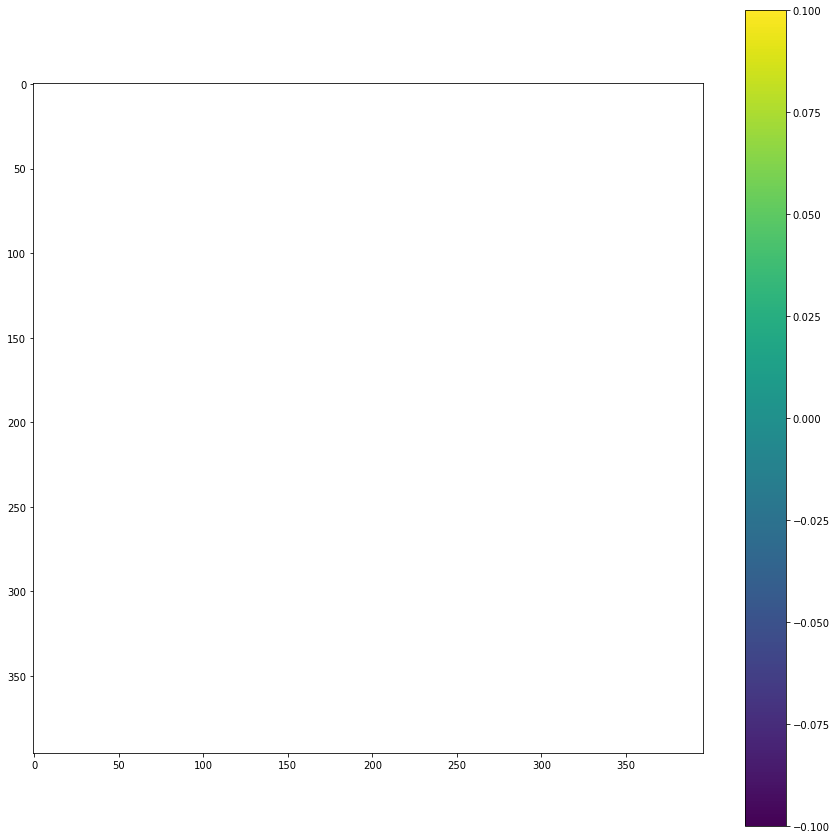

In [152]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,15))
plt.imshow(S)
plt.colorbar()
#plt.xlabel('$\mathtt{\delta_n,max}$', fontsize=20)
#plt.ylabel('$\mathtt{\delta_n,min}$', fontsize=20)
#plt.tick_params('both', labelsize=15)

In [154]:
F

array([[0.17044938, 0.        , 0.26810274, ..., 0.        , 0.12418217,
        0.        ],
       [0.17044938, 0.        , 0.26810274, ..., 0.        , 0.12418217,
        0.        ],
       [0.17044938, 0.        , 0.26810274, ..., 0.        , 0.12418217,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])